# CF Visual Analysis 

### Get data from folds 

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import os
from scipy.stats import gaussian_kde
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
import torch
import torchxrayvision as xrv
import sys

In [2]:
plt.rcParams.update({
    'font.size': 17,
    'axes.linewidth': 1.2,
    'axes.titlesize': 18,
    'axes.labelsize': 16,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 15,
})


In [3]:
CF_COUNT = 16
DISEASE = 'effusion'

In [92]:
def organ_colours(delta_col):
    if "Heart" in delta_col:
        # coral red
        return '#ba6146'
    elif "Left Hilus Pulmonis" in delta_col or "Right Hilus Pulmonis" in delta_col:
        # soft blue
        return "#6e84b7"
    elif "Left Scapula" in delta_col or "Right Scapula" in delta_col:
        # light green
        return "#79AA79"
    elif "Spine" in delta_col:
        # purple
        return "#9b59b6"

    elif "Left Lung" in delta_col or "Right Lung" in delta_col:
        # yellow
        return "#f1c40f"
    else:
        return 'gray'

In [32]:
# ── CONFIG ────────────────────────────────────────────────────────────────────
DATA_DIR     = "/zhome/d0/a/221493/thesis/data/"
KEY_FEATURES = [
    "Heart_original_firstorder_Variance",
    "Heart_original_firstorder_MeanAbsoluteDeviation",
    "Heart_original_firstorder_10Percentile",
]
PROB_COL     = "effusion_prob"
SEG_TARGET   = "Heart"  # which segmentation mask to overlay

# ── LOAD SEGMENTATION MODEL ───────────────────────────────────────────────────
print("Loading PSPNet segmentation model...")
seg_model = xrv.baseline_models.chestx_det.PSPNet()
seg_model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
seg_model.to(device)
heart_idx = seg_model.targets.index(SEG_TARGET)

transform = xrv.datasets.XRayResizer(224)

def get_heart_mask(img_path):
    """Load image, run PSPNet, return binary heart mask (224x224)."""
    img = Image.open(os.path.join(DATA_DIR, img_path)).convert("L")
    img_np = np.array(img).astype(np.float32)
    # Normalize to [-1024, 1024] range that TorchXRayVision expects
    img_np = (img_np / 255.0) * 2048 - 1024
    img_np = transform(img_np[None])  # (1, H, W)
    img_tensor = torch.from_numpy(img_np).unsqueeze(0).to(device)  # (1, 1, H, W)
    with torch.no_grad():
        seg_out = seg_model(img_tensor).cpu().numpy()
    seg_out = 1 / (1 + np.exp(-seg_out))  # sigmoid
    mask = (seg_out[0, heart_idx] >= 0.5).astype(np.uint8)
    return mask

def load_image_gray(img_path):
    """Load image as grayscale numpy array."""
    img = Image.open(os.path.join(DATA_DIR, img_path)).convert("L")
    return np.array(img)

def overlay_mask_on_image(ax, img_np, mask, title, feature_text):
    if mask.shape != img_np.shape:
        from PIL import Image as PILImage
        mask_pil = PILImage.fromarray(mask * 255).resize(
            (img_np.shape[1], img_np.shape[0]), PILImage.NEAREST
        )
        mask = (np.array(mask_pil) > 0).astype(np.uint8)

    ax.imshow(img_np, cmap='gray')
    ax.contour(mask, levels=[0.5], colors='red', linewidths=1.5)
    ax.set_title(title, fontsize=9)
    ax.axis('off')

    if feature_text:
        ax.set_xlabel(feature_text, fontsize=9, family='monospace', loc='left')

Loading PSPNet segmentation model...


In [58]:
def plot_sample_image(sample, title, overlay_organs=None):
    """
    Plot an X-ray image with optional segmentation overlays.
    
    Parameters
    ----------
    sample : pd.Series
    title : str
    overlay_organs : list of str, 'all', or None
        e.g. ['Heart', 'Left Lung'] or 'all'
    """
    img_path = sample['path']
    img_np   = load_image_gray(img_path)

    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    ax.imshow(img_np, cmap='gray')

    if overlay_organs is not None:
        # Resolve which organs to overlay
        organs_to_plot = seg_model.targets if overlay_organs == 'all' else overlay_organs

        # One forward pass for all organs at once
        img_pil = Image.open(os.path.join(DATA_DIR, img_path)).convert("L")
        img_np_norm = (np.array(img_pil).astype(np.float32) / 255.0) * 2048 - 1024
        img_tensor  = torch.from_numpy(transform(img_np_norm[None])).unsqueeze(0).to(device)

        with torch.no_grad():
            seg_out = seg_model(img_tensor).cpu().numpy()
        seg_out = 1 / (1 + np.exp(-seg_out))  # sigmoid

        # Use function "organ_colours" to assign colors based on organ name
        colors = [organ_colours(organ) for organ in organs_to_plot]

        for i, organ in enumerate(organs_to_plot):
            if organ not in seg_model.targets:
                print(f"[WARN] '{organ}' not in seg_model.targets, skipping")
                continue
            idx  = seg_model.targets.index(organ)
            mask = (seg_out[0, idx] >= 0.5).astype(np.uint8)

            # Resize mask to match original image size
            mask_resized = np.array(
                Image.fromarray(mask * 255).resize(
                    (img_np.shape[1], img_np.shape[0]), Image.NEAREST
                )
            ) > 0

            color = colors[i % len(colors)]
            ax.contour(mask_resized, levels=[0.5], colors=[color], linewidths=1.5)
            # fill the contour for better visibility
            ax.contourf(mask_resized, levels=[0.5, 1], colors=[color], alpha=0.3)
            # Small legend patch
            ax.plot([], [], color=color, label=organ, linewidth=1.5)

        ax.legend(fontsize=7, loc='lower right', framealpha=0.6)

    ax.set_title(title, fontsize=10)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

In [26]:
# Load c2 data
CF_COUNT = 16
cf16_fold0_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_{CF_COUNT}/fold_0_predictions.csv")
cf16_fold1_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_{CF_COUNT}/fold_1_predictions.csv")
cf16_fold2_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_{CF_COUNT}/fold_2_predictions.csv")
cf16_fold3_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_{CF_COUNT}/fold_3_predictions.csv")
cf16_fold4_data = pd.read_csv(f"/zhome/d0/a/221493/thesis/results/C2_custom/effusion/cv_results/cf_{CF_COUNT}/fold_4_predictions.csv")


In [119]:
cf16_merged_data = pd.concat([cf16_fold0_data, cf16_fold1_data, cf16_fold2_data, cf16_fold3_data, cf16_fold4_data], ignore_index=True)
cf16_merged_data

,path,effusion_prob,effusion_true,emb_0,emb_1,emb_2,emb_3,emb_4,emb_5,emb_6,...,RF_B4_prob,RF_M3_prob,RF_M6_prob,RF_M7_prob,MLP_B1_prob,MLP_B2_prob,MLP_B4_prob,MLP_M3_prob,MLP_M6_prob,MLP_M7_prob
0,CheXpert-v1.0-small/train/patient00008/study1/...,0.989891,1.0,-0.001258,-0.002981,0.004603,0.001782,0.038358,0.399419,-0.001282,...,0.94,0.925,0.985,0.905,0.980743,0.911461,0.937656,1.000000,1.000000,1.000000
1,CheXpert-v1.0-small/train/patient00008/study2/...,0.803473,1.0,-0.001191,-0.002815,0.002819,0.001348,0.057667,0.703849,-0.001344,...,0.92,0.930,0.905,0.955,0.904083,0.931416,0.932353,0.991720,0.996500,0.839622
2,CheXpert-v1.0-small/train/patient00010/study1/...,0.022443,0.0,-0.001185,-0.000544,0.002301,0.005169,-0.117937,-0.033050,-0.001290,...,0.97,0.950,0.940,0.950,0.949739,0.977377,0.970851,0.999998,0.999991,1.000000
3,CheXpert-v1.0-small/train/patient00012/study2/...,0.061503,0.0,-0.001186,-0.001272,0.003885,0.003653,-0.103996,0.122837,-0.001299,...,0.87,0.950,0.940,0.970,0.898363,0.923050,0.916926,0.999970,0.999952,0.999990
4,CheXpert-v1.0-small/train/patient00012/study1/...,0.029165,0.0,-0.001169,-0.001557,0.002562,0.004091,-0.134545,0.211838,-0.001316,...,0.93,0.950,0.925,0.960,0.943117,0.947813,0.955979,0.999350,0.999999,0.999995
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45150,CheXpert-v1.0-small/train/patient47326/study15...,0.991323,1.0,-0.001218,-0.002772,0.004868,0.001912,0.038572,0.362541,-0.001303,...,0.97,0.975,0.990,0.975,0.979770,0.998907,0.996451,1.000000,0.999998,1.000000
45151,CheXpert-v1.0-small/train/patient47326/study16...,0.997699,1.0,-0.001202,-0.003193,0.004110,0.002293,0.003134,0.662992,-0.001271,...,0.97,0.975,0.975,0.980,0.980806,0.998319,0.995493,1.000000,0.999996,0.999999
45152,CheXpert-v1.0-small/train/patient47326/study6/...,0.994333,1.0,-0.001193,-0.002723,0.003124,0.002845,0.046595,0.291322,-0.001343,...,0.97,0.965,0.960,0.965,0.980266,0.997847,0.990001,1.000000,1.000000,1.000000
45153,CheXpert-v1.0-small/train/patient47326/study14...,0.991939,1.0,-0.001210,-0.003301,0.006024,0.002212,0.097969,0.434269,-0.001248,...,0.97,0.985,0.995,0.980,0.979873,0.996209,0.988378,1.000000,0.999997,0.999860


### Select a representative sample for each quadrant (TP, TN, FP, FN) based on the distribution of predicted probabilities in C2

In [ ]:
import numpy as np
top5_cols = [
    'delta_Heart_original_firstorder_Minimum',
    'delta_Heart_original_firstorder_Mean',
    'delta_Right Lung_original_firstorder_Skewness',
    'delta_Left Scapula_original_firstorder_Mean',
    'delta_Spine_area_pixels',
]

DISEASE = 'effusion'

META_COLS = {
    f'{DISEASE}_prob', f'{DISEASE}_pred', f'{DISEASE}_true',
    'correct', 'path', 'patient_id', 'cf_prob', 'cf_paths', 'margin'
}

ORGANS = [
    "Left Lung", "Right Lung", "Heart", "Mediastinum",
    "Facies Diaphragmatica", "Aorta", "Left Hilus Pulmonis",
    "Right Hilus Pulmonis", "Left Scapula", "Right Scapula",
    "Left Clavicle", "Right Clavicle", "Weasand", "Spine"
]

FEATURE_TYPES = {
    'shape2D': ['shape2D'],
    'firstorder': ['firstorder'],
    'geometric': ['area_pixels', 'bbox', 'perimeter']
}

# Plot both samples images xray
import matplotlib.image as mpimg
def plot_sample_image(sample, title, overlay_organs=None):
    """Plots the x-ray image for a given sample, optionally overlaying organ segmentations.
    Recieves a list of organs to overlay, if None, no overlay is plotted. If 'all', all organs are plotted."""
    
    img_path = sample['path']
    full_path = os.path.join("/zhome/d0/a/221493/thesis/data/", img_path)
    img = mpimg.imread(full_path)
    plt.imshow(img, cmap='gray')
    plt.title(title)
    plt.axis('off') 
    plt.show()
    
def build_categories(columns):

    categories = {}

    for col in columns:

        # label metadata columns but DO NOT skip them
        if col in META_COLS:
            prefix = 'META'
        else:
            prefix = 'Delta' if col.startswith('delta_') else 'Original'

        # find organ
        organ = next((o for o in ORGANS if o in col), 'Global')

        # find feature type
        feature_type = 'other'

        for ftype, keywords in FEATURE_TYPES.items():
            if any(k in col for k in keywords):
                feature_type = ftype
                break

        # build category name
        category = f"{prefix} | {organ} | {feature_type}"

        categories.setdefault(category, []).append(col)

    return categories

# build categories
feature_cols = [
    c for c in cf16_merged_data.columns
    if c not in META_COLS
]

categories = build_categories(feature_cols)

# 1. Prep Quadrants dynamically based on your DISEASE name
def get_quadrant(row):
    p, t = int(row[f'{DISEASE}_pred']), int(row[f'{DISEASE}_true'])
    if p == 1 and t == 1: return 'TP'
    if p == 0 and t == 0: return 'TN'
    if p == 1 and t == 0: return 'FP'
    if p == 0 and t == 1: return 'FN'

cf16_merged_data['quadrant'] = cf16_merged_data.apply(get_quadrant, axis=1)

# Split pools
tp_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'TP']
fn_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'FN']
tn_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'TN']
fp_pool = cf16_merged_data[cf16_merged_data['quadrant'] == 'FP']

# 2. Ranking selection helper function
def get_representative_row_by_rank(pool_df, features, rank=0):
    feat_subset = pool_df[features].dropna()
    if feat_subset.empty:
        return pool_df.iloc[0]
        
    mean_vec = feat_subset.mean().values
    mean_norm = np.linalg.norm(mean_vec)
    
    sample_matrix = feat_subset.values
    sample_norms = np.linalg.norm(sample_matrix, axis=1)
    sample_norms[sample_norms == 0] = 1e-9
    
    # Cosine Similarity ranking
    cosine_similarities = np.dot(sample_matrix, mean_vec) / (sample_norms * mean_norm)
    sorted_indices = feat_subset.index[np.argsort(-cosine_similarities)]
    
    target_rank = min(rank, len(sorted_indices) - 1)
    return pool_df.loc[sorted_indices[target_rank]]

# 3. Select your frontline samples (Using Rank 1 for TN to skip bad segments)
true_positive_sample  = get_representative_row_by_rank(tp_pool, top5_cols, rank=0)
false_negative_sample = get_representative_row_by_rank(fn_pool, top5_cols, rank=0)
false_positive_sample = get_representative_row_by_rank(fp_pool, top5_cols, rank=0)
true_negative_sample  = get_representative_row_by_rank(tn_pool, top5_cols, rank=1) # Next best

# Extract your delta vectors for the downstream plotting step
tp_delta = true_positive_sample[top5_cols].values
fn_delta = false_negative_sample[top5_cols].values
tn_delta = true_negative_sample[top5_cols].values
fp_delta = false_positive_sample[top5_cols].values

print(f"TP  — C0: {true_positive_sample[f'{DISEASE}_prob']:.3f}, Path: {true_positive_sample['path']}")
print(f"FN  — C0: {false_negative_sample[f'{DISEASE}_prob']:.3f}, Path: {false_negative_sample['path']}")
print(f"TN  — C0: {true_negative_sample[f'{DISEASE}_prob']:.3f}, Path: {true_negative_sample['path']} (Rank 1)")
print(f"FP  — C0: {false_positive_sample[f'{DISEASE}_prob']:.3f}, Path: {false_positive_sample['path']}")

TP  — C0: 0.983, Path: CheXpert-v1.0-small/train/patient35085/study3/view1_frontal.jpg
FN  — C0: 0.018, Path: CheXpert-v1.0-small/train/patient30508/study1/view1_frontal.jpg
TN  — C0: 0.025, Path: CheXpert-v1.0-small/train/patient11933/study1/view1_frontal.jpg (Rank 1)
FP  — C0: 0.946, Path: CheXpert-v1.0-small/train/patient17227/study3/view1_frontal.jpg


In [122]:
true_positive_sample_cf_paths = cf16_merged_data.loc[true_positive_sample.name, 'cf_paths']
# Split paths by "|" and make a list
true_positive_sample_cf_paths = true_positive_sample_cf_paths.split("|")
#print("Counterfactual paths for the true positive sample:")
#for i, path in enumerate(true_positive_sample_cf_paths):
#    print(f"  CF {i+1}: {path}")

true_negative_sample_cf_paths = cf16_merged_data.loc[true_negative_sample.name, 'cf_paths']
true_negative_sample_cf_paths = true_negative_sample_cf_paths.split("|")

false_positive_sample_cf_paths = cf16_merged_data.loc[false_positive_sample.name, 'cf_paths']
false_positive_sample_cf_paths = false_positive_sample_cf_paths.split("|")  

false_negative_sample_cf_paths = cf16_merged_data.loc[false_negative_sample.name, 'cf_paths']
false_negative_sample_cf_paths = false_negative_sample_cf_paths.split("|")

# check they all have 16 counterfactual paths
print(f"True Positive Sample CF paths: {len(true_positive_sample_cf_paths)}")
print(f"True Negative Sample CF paths: {len(true_negative_sample_cf_paths)}")
print(f"False Positive Sample CF paths: {len(false_positive_sample_cf_paths)}")
print(f"False Negative Sample CF paths: {len(false_negative_sample_cf_paths)}")


True Positive Sample CF paths: 16
True Negative Sample CF paths: 16
False Positive Sample CF paths: 16
False Negative Sample CF paths: 16


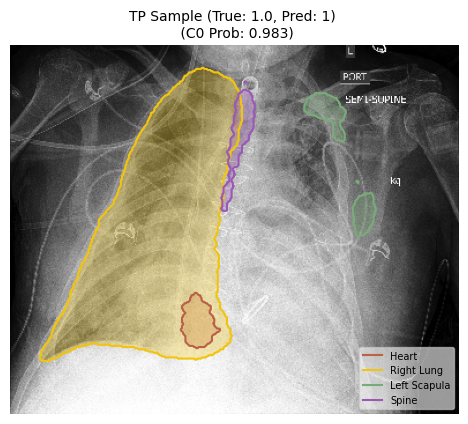

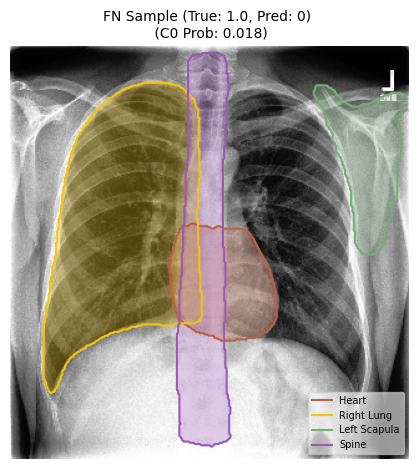

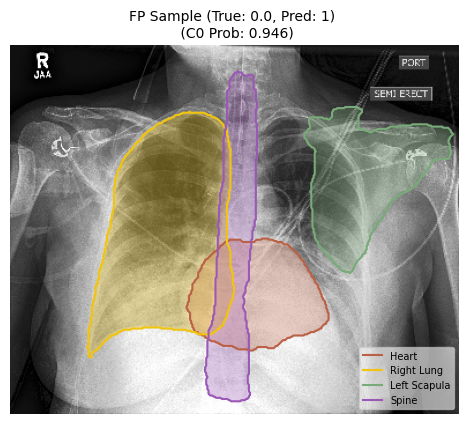

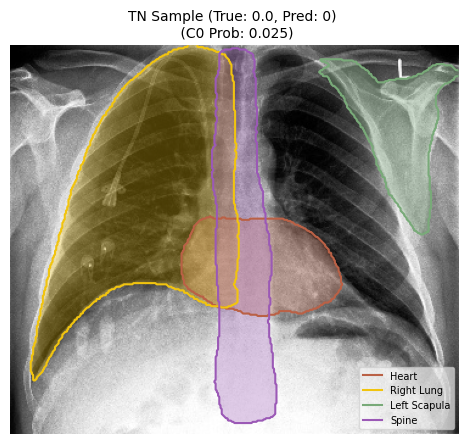

In [136]:
# Plot the 4 chosen samples
plot_sample_image(true_positive_sample, f'TP Sample (True: {true_positive_sample[f"{DISEASE}_true"]}, Pred: {true_positive_sample[f"{DISEASE}_pred"]}) \n (C0 Prob: {true_positive_sample[f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine'])
plot_sample_image(false_negative_sample, f'FN Sample (True: {false_negative_sample[f"{DISEASE}_true"]}, Pred: {false_negative_sample[f"{DISEASE}_pred"]}) \n (C0 Prob: {false_negative_sample[f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine'])
plot_sample_image(false_positive_sample, f'FP Sample (True: {false_positive_sample[f"{DISEASE}_true"]}, Pred: {false_positive_sample[f"{DISEASE}_pred"]}) \n (C0 Prob: {false_positive_sample[f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine'])
plot_sample_image(true_negative_sample, f'TN Sample (True: {true_negative_sample[f"{DISEASE}_true"]}, Pred: {true_negative_sample[f"{DISEASE}_pred"]}) \n (C0 Prob: {true_negative_sample[f"{DISEASE}_prob"]:.3f})', overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine'])

True Positive Sample and its Counterfactuals:


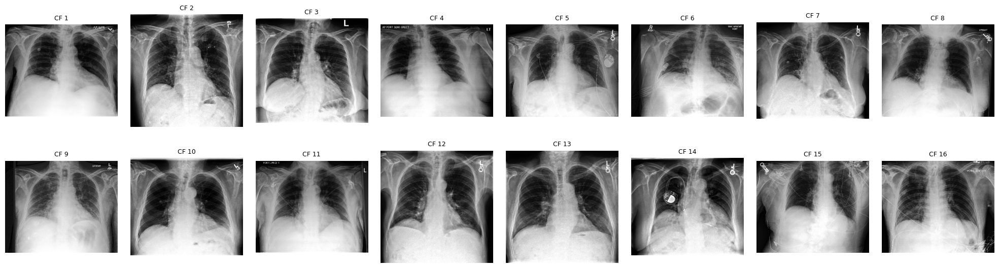

True Negative Sample and its Counterfactuals:


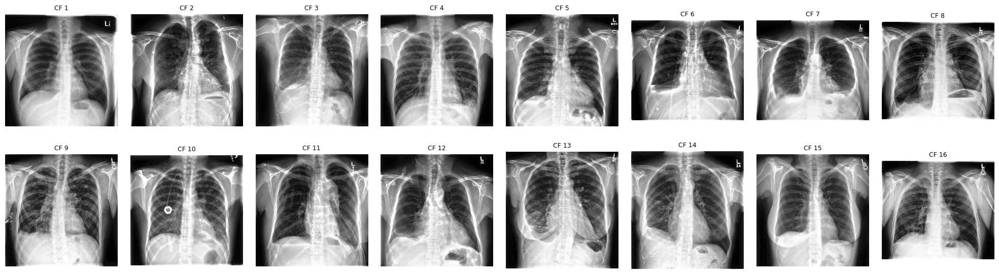

False Positive Sample and its Counterfactuals:


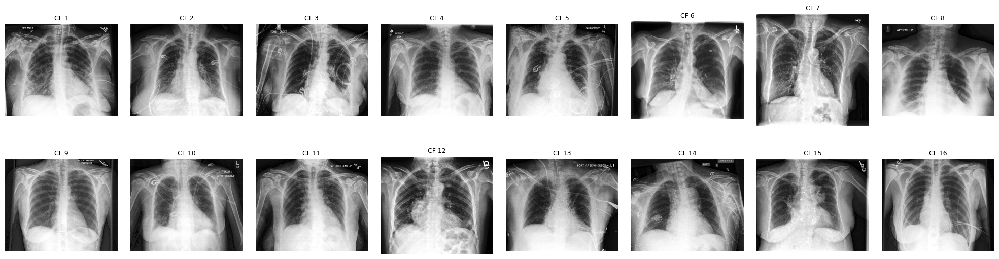

False Negative Sample and its Counterfactuals:


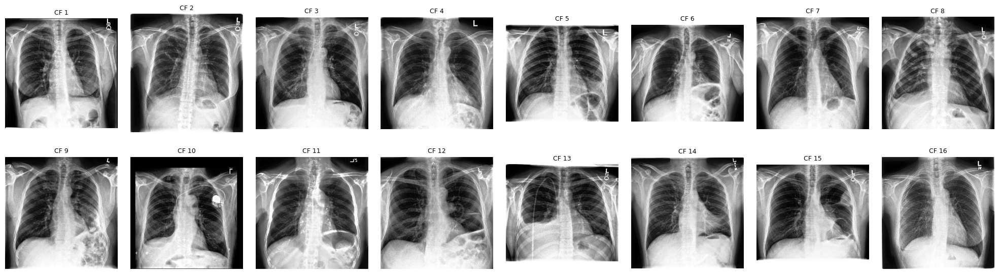

In [ ]:
def plot_cfs(sample, cf_paths, title = None):
    fig, axes = plt.subplots(2, 8, figsize=(20, 6))

    for i, cf_path in enumerate(cf_paths):
        row, col = divmod(i, 8)
        cf_img_np = load_image_gray(cf_path)
        axes[row, col].imshow(cf_img_np, cmap='gray')
        axes[row, col].set_title(f"CF {i+1}", fontsize=9)
        axes[row, col].axis('off')

    # Hide any unused axes
    for slot in range(len(cf_paths), 16):
        row, col = divmod(slot, 8)
        axes[row, col].axis('off')
    if title:
        plt.suptitle(title, fontsize=10)
    plt.tight_layout()
    plt.show()
    

print("True Positive Sample and its Counterfactuals:")
    
plot_cfs(
    true_positive_sample,
    true_positive_sample_cf_paths,)

print("True Negative Sample and its Counterfactuals:")
plot_cfs(
    true_negative_sample,
    true_negative_sample_cf_paths,) 

print("False Positive Sample and its Counterfactuals:")
plot_cfs(
    false_positive_sample,
    false_positive_sample_cf_paths,)

print("False Negative Sample and its Counterfactuals:")
plot_cfs(
    false_negative_sample,
    false_negative_sample_cf_paths,)    


In [138]:
def plot_kde_with_cf16(
    cf16_merged_data, cf1_merged_data,
    sample, sample_cf_paths,
    disease, threshold=0.5634,
    title = None
):
    positive = cf16_merged_data[cf16_merged_data[f'{disease}_true'] == 1]
    negative = cf16_merged_data[cf16_merged_data[f'{disease}_true'] == 0]

    kde_pos = gaussian_kde(positive[f'{disease}_prob'])
    kde_neg = gaussian_kde(negative[f'{disease}_prob'])

    sample_true = sample[f'{disease}_true']
    sample_prob = sample[f'{disease}_prob']

    # Get prob for each of the 16 CFs by looking up their path in cf16_merged_data
    cf_probs = []
    for cf_path in sample_cf_paths:
        row = cf16_merged_data[cf16_merged_data['path'] == cf_path]
        if not row.empty:
            cf_probs.append(row[f'{disease}_prob'].values[0])
    cf_probs = np.array(cf_probs)
    mean_cf_prob = cf_probs.mean()

    fig, ax = plt.subplots(figsize=(6, 6))

    sns.kdeplot(positive[f'{disease}_prob'], label='Positive (Effusion)',
                fill=True, alpha=0.5, color="#439e49", ax=ax)
    sns.kdeplot(negative[f'{disease}_prob'], label='Negative (No Effusion)',
                fill=True, alpha=0.5, color="#ba6146", ax=ax)

    ax.axvline(threshold, color='red', linestyle='--', label=f'Threshold = {threshold}')

    # Original sample — pick KDE based on ground truth
    sample_kde = kde_pos if sample_true == 1 else kde_neg
    sample_y = sample_kde(sample_prob)[0]
    ax.axvline(sample_prob, color='orange', linewidth=2,
               label=f'Sample (p={sample_prob:.3f})')
    ax.scatter(sample_prob, sample_y, color='orange', s=150, zorder=5)

    # 16 thin CF lines
    for i, cf_prob in enumerate(cf_probs):
        cf_true = sample_true  # CFs share the same ground truth class
        cf_kde = kde_pos if cf_true == 1 else kde_neg
        cf_y = cf_kde(cf_prob)[0]
        ax.axvline(cf_prob, color='purple',linestyle = '--',linewidth=0.6, alpha=0.4,
                   label='CFs' if i == 0 else None)
        ax.scatter(cf_prob, cf_y, color='purple', s=40, alpha=0.5, zorder=4)

    # Thick mean CF line
    mean_kde = kde_pos if sample_true == 1 else kde_neg
    mean_y = mean_kde(mean_cf_prob)[0]
    ax.axvline(mean_cf_prob, color='purple', linewidth=2.5,
               label=f'Mean CF (p={mean_cf_prob:.3f})')
    ax.scatter(mean_cf_prob, mean_y, color='purple', s=150, zorder=6, marker='*')

    ax.set_xlabel(f'Predicted Probability of {disease.capitalize()}')
    ax.set_ylabel('Density')
    ax.set_title(f'C0 distribution {title} \n(GT={sample_true}, p={sample_prob:.3f})')
    ax.legend()
    plt.tight_layout()
    plt.show()

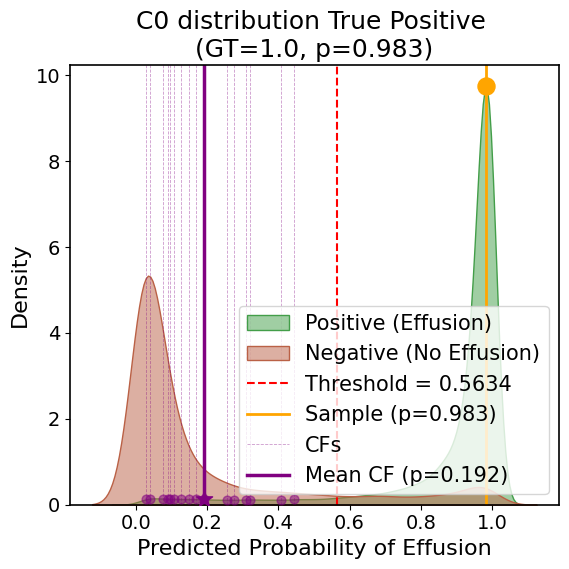

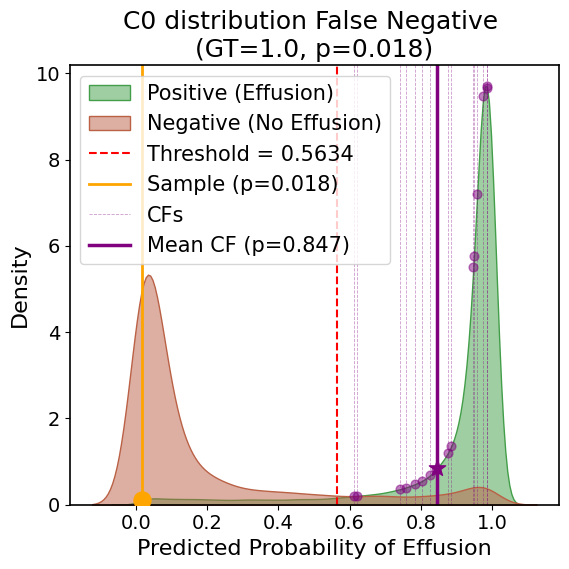

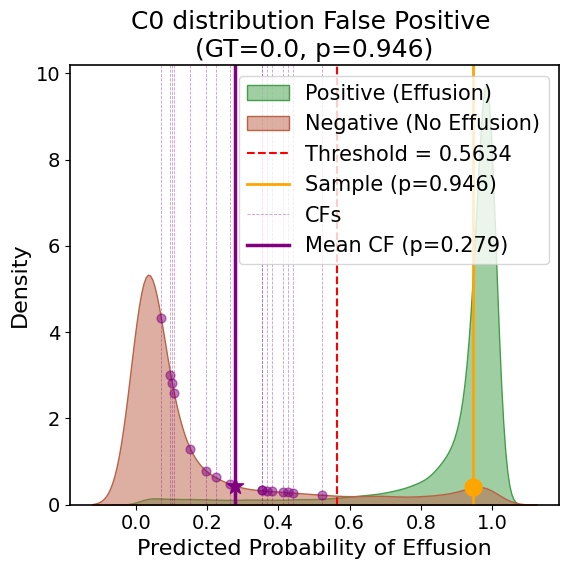

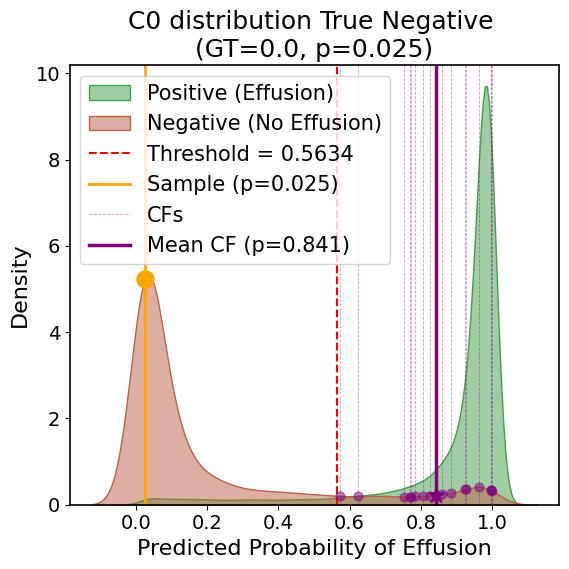

In [139]:
plot_kde_with_cf16(cf16_merged_data, cf1_merged_data, true_positive_sample,  true_positive_sample_cf_paths,  DISEASE, title = "True Positive")
plot_kde_with_cf16(cf16_merged_data, cf1_merged_data, false_negative_sample, false_negative_sample_cf_paths, DISEASE, title = "False Negative")
plot_kde_with_cf16(cf16_merged_data, cf1_merged_data, false_positive_sample, false_positive_sample_cf_paths, DISEASE, title = "False Positive")
plot_kde_with_cf16(cf16_merged_data, cf1_merged_data, true_negative_sample,  true_negative_sample_cf_paths,  DISEASE, title = "True Negative")

Selected True Positive Sample: Path=CheXpert-v1.0-small/train/patient35300/study12/view1_frontal.jpg, C0 Prob=0.986, LR_M6 Prob=1.000
Distribution counts: TP=32053 FN=2469 TN=9365 FP=1268


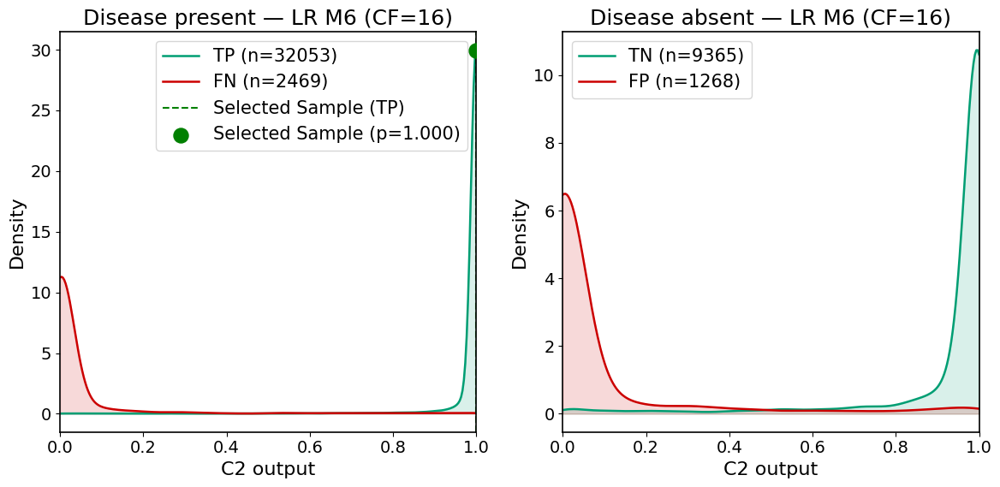

Selected False Positive Sample: Path=CheXpert-v1.0-small/train/patient11582/study33/view1_frontal.jpg, C0 Prob=0.654, LR_M6 Prob=0.000
Distribution counts: TP=32053 FN=2469 TN=9365 FP=1268


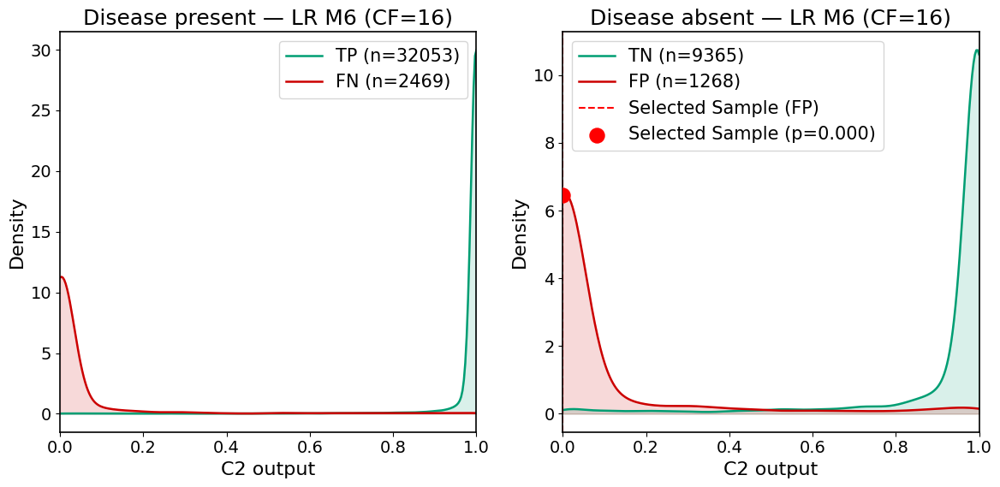

Selected True Negative Sample: Path=CheXpert-v1.0-small/train/patient20607/study1/view1_frontal.jpg, C0 Prob=0.010, LR_M6 Prob=0.806
Distribution counts: TP=32053 FN=2469 TN=9365 FP=1268


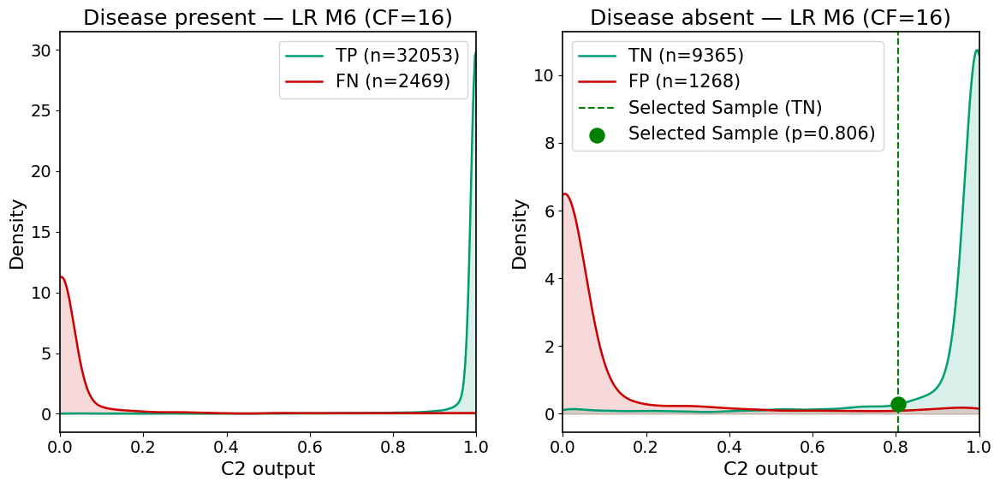

Selected False Negative Sample: Path=CheXpert-v1.0-small/train/patient17834/study14/view1_frontal.jpg, C0 Prob=0.559, LR_M6 Prob=0.000
Distribution counts: TP=32053 FN=2469 TN=9365 FP=1268


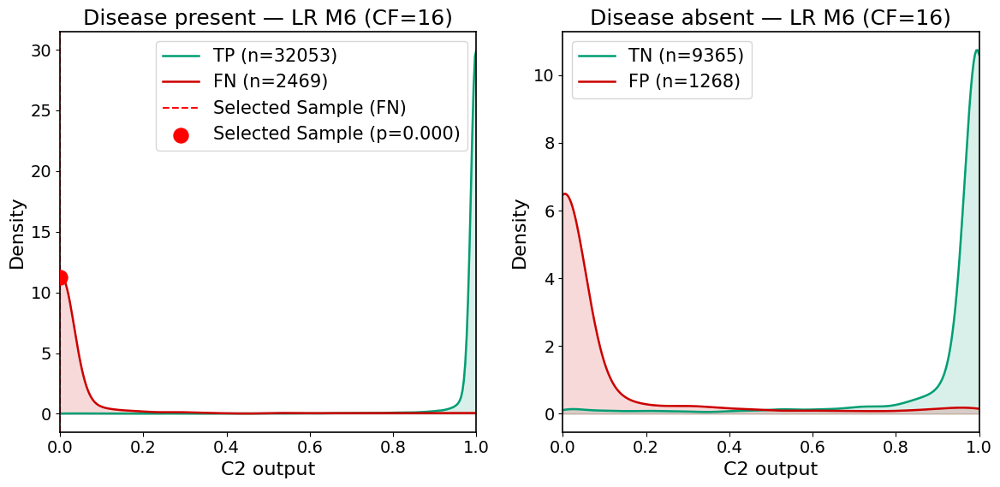

In [78]:

# True Positive sample (TP — C0 predicted positive, ground truth positive)
print(f"Selected True Positive Sample: Path={true_positive_sample['path']}, C0 Prob={true_positive_sample[f'{DISEASE}_prob']:.3f}, LR_M6 Prob={true_positive_sample['LR_M6_prob']:.3f}")
plot_distributions_with_selected_sample(
    aggregated_df=cf16_merged_data,
    disease=DISEASE,
    cf_count=16,
    model_type='LR',
    config='M6',
    selected_sample_prob=true_positive_sample['LR_M6_prob'],
    selected_sample_correctness=true_positive_sample['correct'],
    selected_sample_true_label=true_positive_sample[f'{DISEASE}_true'],
)
print(f"Selected False Positive Sample: Path={false_positive_sample['path']}, C0 Prob={false_positive_sample[f'{DISEASE}_prob']:.3f}, LR_M6 Prob={false_positive_sample['LR_M6_prob']:.3f}")
# Incorrect sample (FN — C0 predicted negative, ground truth positive)
plot_distributions_with_selected_sample(
    aggregated_df=cf16_merged_data,
    disease=DISEASE,
    cf_count=16,
    model_type='LR',
    config='M6',
    selected_sample_prob=false_positive_sample['LR_M6_prob'],
    selected_sample_correctness=false_positive_sample['correct'],
    selected_sample_true_label=false_positive_sample[f'{DISEASE}_true'],
)
print(f"Selected True Negative Sample: Path={true_negative_sample['path']}, C0 Prob={true_negative_sample[f'{DISEASE}_prob']:.3f}, LR_M6 Prob={true_negative_sample['LR_M6_prob']:.3f}")    
    # now for the false positive (nO EFFUSION) the KDE value is on the negative curve, because the GT is 1 (effusion)
plot_distributions_with_selected_sample(
    aggregated_df=cf16_merged_data,
    disease=DISEASE,
    cf_count=16,
    model_type='LR',
    config='M6',
    selected_sample_prob=true_negative_sample['LR_M6_prob'],
    selected_sample_correctness=true_negative_sample['correct'],
    selected_sample_true_label=true_negative_sample[f'{DISEASE}_true'],
)

print(f"Selected False Negative Sample: Path={false_negative_sample['path']}, C0 Prob={false_negative_sample[f'{DISEASE}_prob']:.3f}, LR_M6 Prob={false_negative_sample['LR_M6_prob']:.3f}")
plot_distributions_with_selected_sample(
    aggregated_df=cf16_merged_data,
    disease=DISEASE,
    cf_count=16,
    model_type='LR',
    config='M6',
    selected_sample_prob=false_negative_sample['LR_M6_prob'],
    selected_sample_correctness=false_negative_sample['correct'],
    selected_sample_true_label=false_negative_sample[f'{DISEASE}_true'],
)

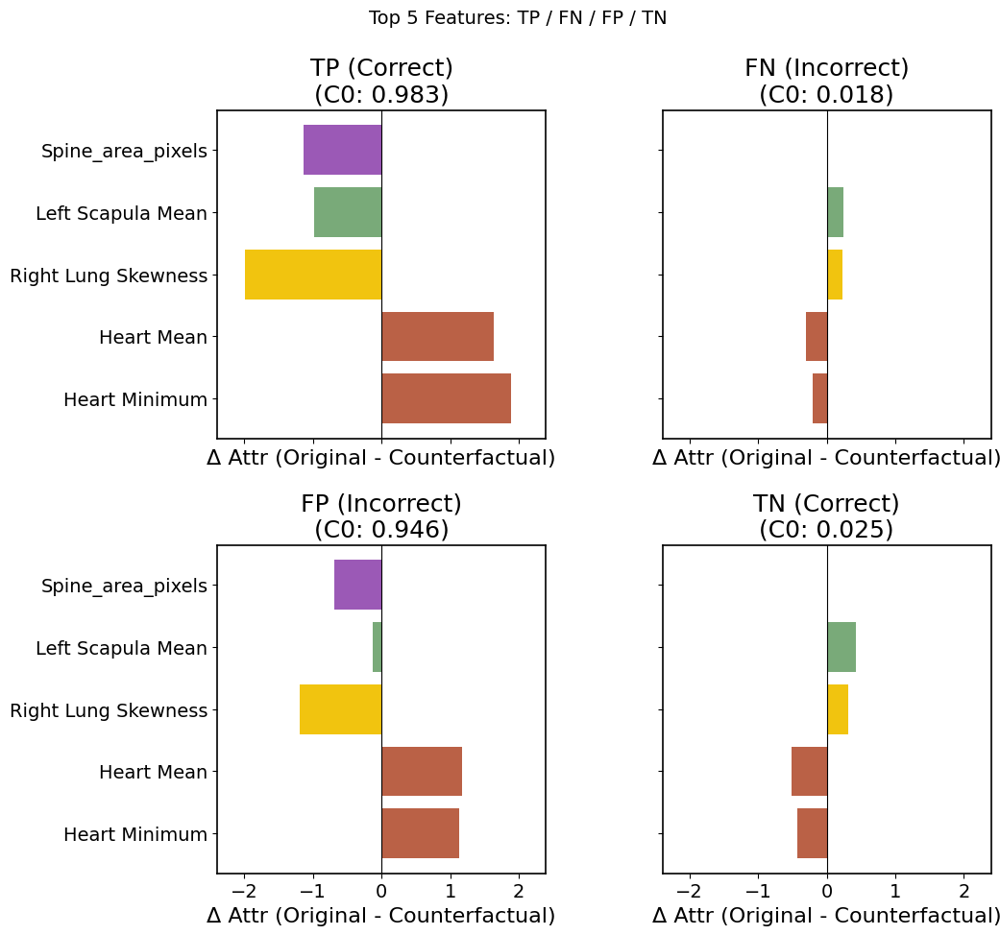

In [140]:


# ── 3. Clean names ─────────────────────────────────────────────────────────────
def clean_name(col):
    return (col
        .replace('delta_', '')
        .replace('_original_firstorder_', ' ')
        .replace('_original_shape2D_', ' ')
    )

short_names = [clean_name(c) for c in top5_cols]


fig, axes = plt.subplots(2, 2, figsize=(12, 10),sharex=True, sharey=True)
axes = axes.flatten()

samples = [
    (tp_delta, 'TP (Correct)',   true_positive_sample),
    (fn_delta, 'FN (Incorrect)', false_negative_sample),
    (fp_delta, 'FP (Incorrect)', false_positive_sample),
    (tn_delta, 'TN (Correct)',   true_negative_sample),
]

all_deltas = np.concatenate([tp_delta, fn_delta, fp_delta, tn_delta])
x_lim = max(abs(all_deltas.min()), abs(all_deltas.max())) * 1.2

for ax, (delta, label, sample) in zip(axes, samples):
    colors = [organ_colours(c) for c in top5_cols]
    ax.barh(short_names, delta, color=colors)
    ax.axvline(0, color='black', linewidth=0.8)
    ax.set_title(f'{label}\n(C0: {sample[f"{DISEASE}_prob"]:.3f})')
    ax.set_xlabel('Δ Attr (Original - Counterfactual)')
    ax.set_xlim(-x_lim, x_lim)
    ax.set_aspect('auto')
    ax.set_box_aspect(1)  # makes each subplot square

plt.suptitle('Top 5 Features: TP / FN / FP / TN', fontsize=14)
plt.tight_layout()
plt.show()

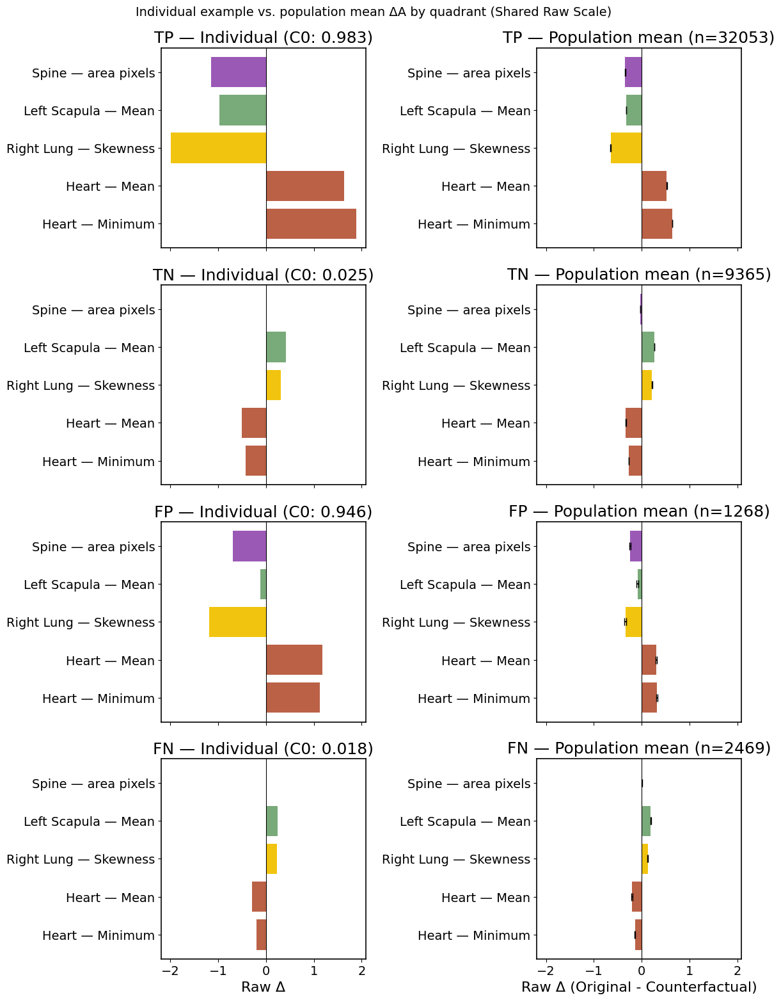

In [142]:

# Extract your exact delta values matching the selection
tp_delta = true_positive_sample[top5_cols].values
fn_delta = false_negative_sample[top5_cols].values
tn_delta = true_negative_sample[top5_cols].values
fp_delta = false_positive_sample[top5_cols].values

# 4. Global configurations for Plotting
def clean_name(col):
    s = col.replace('delta_', '')
    if 'original' not in s:
        parts = s.rsplit('_', 2)
        return f"{parts[0].replace('_',' ')} — {' '.join(parts[1:])}"
    organ, rest = s.split('_original_', 1)
    organ = organ.replace('_', ' ')
    stat  = rest.split('_', 1)[-1]
    return f"{organ} — {stat}"

short_names = [clean_name(c) for c in top5_cols]
colors = [organ_colours(c) for c in top5_cols]

pop_means = {q: cf16_merged_data[cf16_merged_data['quadrant'] == q][top5_cols].mean().values for q in ['TP', 'TN', 'FP', 'FN']}
pop_sems  = {q: cf16_merged_data[cf16_merged_data['quadrant'] == q][top5_cols].sem().values for q in ['TP', 'TN', 'FP', 'FN']}

samples = [
    ('TP', tp_delta, true_positive_sample),
    ('TN', tn_delta, true_negative_sample),
    ('FP', fp_delta, false_positive_sample),
    ('FN', fn_delta, false_negative_sample),
]

# 5. Build Grid Plot
fig, axes = plt.subplots(4, 2, figsize=(12, 16), sharex=True)

for row, (quad, delta, sample) in enumerate(samples):
    ax_ind = axes[row, 0]
    ax_pop = axes[row, 1]
    
    # Left Side: Representative Individual Case
    ax_ind.barh(short_names, delta, color=colors)
    ax_ind.axvline(0, color='black', linewidth=0.8)
    ax_ind.set_title(f'{quad} — Individual (C0: {sample[f"{DISEASE}_prob"]:.3f})')
    if row == 3:
        ax_ind.set_xlabel('Raw Δ')

    # Right Side: Entire Subpopulation Mean
    ax_pop.barh(short_names, pop_means[quad], xerr=pop_sems[quad], color=colors, capsize=4)
    ax_pop.axvline(0, color='black', linewidth=0.8)
    ax_pop.set_title(f'{quad} — Population mean (n={(cf16_merged_data["quadrant"] == quad).sum()})')
    if row == 3:
        ax_pop.set_xlabel('Raw Δ (Original - Counterfactual)')

plt.suptitle('Individual example vs. population mean ΔA by quadrant (Shared Raw Scale)', fontsize=14)
plt.tight_layout()
# save as png   
plt.savefig("deltaA_individual_vs_population.png", dpi=1200)
plt.show()

In [146]:
def plot_avg_cf_image(cf_paths, title, overlay_organs=None):
    plt.close('all')

    # ── 1. Average image ───────────────────────────────────────────────────────´
    print(f"Loading and averaging {len(cf_paths)} counterfactual images...")
    ref = load_image_gray(cf_paths[0])
    target_h, target_w = ref.shape

    imgs = []
    for p in cf_paths:
        img = load_image_gray(p).astype(np.float32)
        if img.shape != (target_h, target_w):
            img = np.array(Image.fromarray(img.astype(np.uint8)).resize(
                (target_w, target_h), Image.BILINEAR
            )).astype(np.float32)
        imgs.append(img)

    avg_img = np.mean(imgs, axis=0).astype(np.uint8)

    print("Creating figure and axis...")
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))  # ← was missing
    ax.imshow(avg_img, cmap='gray')

    print(f"Overlaying segmentation for organs: {overlay_organs if overlay_organs else 'None'}")
    if overlay_organs is not None:
        organs_to_plot = seg_model.targets if overlay_organs == 'all' else overlay_organs
        colors = [organ_colours(organ) for organ in organs_to_plot]

        # ── 2. Average segmentation ────────────────────────────────────────────
        print("Running PSPNet on each CF image for segmentation...")
        seg_accumulator = None
        for cf_path in cf_paths:
            img_pil = Image.open(os.path.join(DATA_DIR, cf_path)).convert("L")
            img_np_norm = (np.array(img_pil).astype(np.float32) / 255.0) * 2048 - 1024
            img_tensor = torch.from_numpy(transform(img_np_norm[None])).unsqueeze(0).to(device)

            with torch.no_grad():
                seg_out = seg_model(img_tensor).cpu().numpy()
            seg_out = 1 / (1 + np.exp(-seg_out))

            if seg_accumulator is None:
                seg_accumulator = seg_out
            else:
                seg_accumulator += seg_out
        print("Averaging segmentation outputs...")
        avg_seg = seg_accumulator / len(cf_paths)

        # ── 3. Overlay ─────────────────────────────────────────────────────────
        print("Overlaying contours for each organ...")
        for i, organ in enumerate(organs_to_plot):
            if organ not in seg_model.targets:
                print(f"[WARN] '{organ}' not in seg_model.targets, skipping")
                continue
            idx = seg_model.targets.index(organ)
            mask = (avg_seg[0, idx] >= 0.5).astype(np.uint8)

            mask_resized = np.array(
                Image.fromarray(mask * 255).resize(
                    (avg_img.shape[1], avg_img.shape[0]), Image.NEAREST
                )
            ) > 0

            color = colors[i % len(colors)]
            ax.contour(mask_resized, levels=[0.5], colors=[color], linewidths=1.5)
            ax.contourf(mask_resized, levels=[0.5, 1], colors=[color], alpha=0.3)
            ax.plot([], [], color=color, label=organ, linewidth=1.5)

        ax.legend(fontsize=7, loc='lower right', framealpha=0.6)

    ax.set_title(title, fontsize=10)
    ax.axis('off')
    plt.tight_layout()
    plt.show()

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Heart', 'Right Lung', 'Left Scapula', 'Spine']
Running PSPNet on each CF image for segmentation...
Averaging segmentation outputs...
Overlaying contours for each organ...


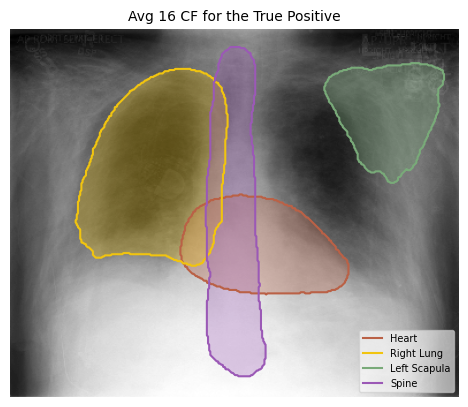

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Heart', 'Right Lung', 'Left Scapula', 'Spine']
Running PSPNet on each CF image for segmentation...
Averaging segmentation outputs...
Overlaying contours for each organ...


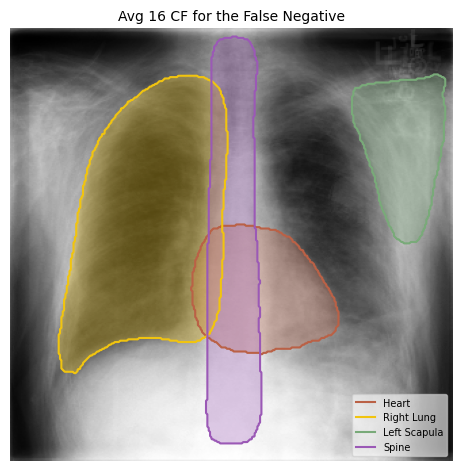

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Heart', 'Right Lung', 'Left Scapula', 'Spine']
Running PSPNet on each CF image for segmentation...
Averaging segmentation outputs...
Overlaying contours for each organ...


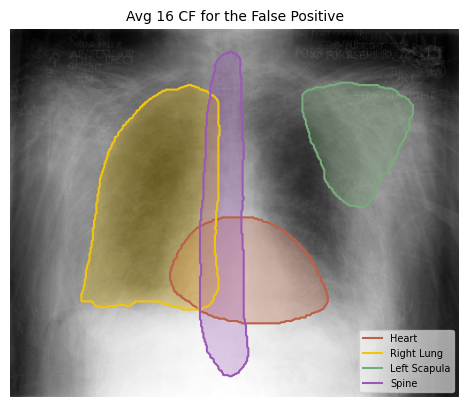

Loading and averaging 16 counterfactual images...
Creating figure and axis...
Overlaying segmentation for organs: ['Heart', 'Right Lung', 'Left Scapula', 'Spine']
Running PSPNet on each CF image for segmentation...


In [ ]:
plot_avg_cf_image(
    true_positive_sample_cf_paths,
    title="Avg 16 CF for the True Positive",
    overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine'])
# now for the FN, TN, FP
plot_avg_cf_image(
    false_negative_sample_cf_paths,
    title="Avg 16 CF for the False Negative",
    overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine']
)   

plot_avg_cf_image(
    false_positive_sample_cf_paths,
    title="Avg 16 CF for the False Positive",
    overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine']
)
plot_avg_cf_image(
    true_negative_sample_cf_paths,
    title="Avg 16 CF for the True Negative",
    overlay_organs=['Heart', 'Right Lung', 'Left Scapula', 'Spine']
)   

# Average across dataset